In [1]:
import os
import pydicom
import matplotlib.pyplot as plt
import numpy as np
from collections import defaultdict

# Ruta de la carpeta donde están los archivos DICOM
dicom_folder = "C:/Users/lcres/PycharmProjects/Software/Archivos_Dicom/18380000"



convierte dicom a nifti por numero de serie

In [2]:
import os
import pydicom
import nibabel as nib
import numpy as np
from pydicom.data import get_testdata_files
from collections import defaultdict

def load_dicom_series(dicom_folder):
    dicom_series = defaultdict(list)
    
    # Iterar a través de todos los archivos DICOM en la carpeta
    for root, _, files in os.walk(dicom_folder):
        for file in files:
            if file.endswith('.dcm') or file.endswith(''):  # Asume que son DICOM si no tienen extensión
                dicom_file = os.path.join(root, file)
                ds = pydicom.dcmread(dicom_file)
                
                # Agrupar por SeriesInstanceUID
                series_uid = ds.SeriesInstanceUID
                dicom_series[series_uid].append(ds)
    
    # Ordenar cada serie por InstanceNumber
    for series_uid, dicom_files in dicom_series.items():
        dicom_files.sort(key=lambda x: x.InstanceNumber)
    
    return dicom_series

def convert_series_to_nifti(dicom_series, output_folder):
    for series_uid, dicom_files in dicom_series.items():
        # Crear un array 3D con las imágenes ordenadas
        slices = [ds.pixel_array for ds in dicom_files]
        volume = np.stack(slices, axis=-1)
        
        # Crear el objeto NIfTI
        affine = np.eye(4)  # Ejemplo básico, deberías calcular la matriz affine según los DICOM
        nifti_img = nib.Nifti1Image(volume, affine)
        
        # Guardar el archivo NIfTI
        output_path = os.path.join(output_folder, f'series_{series_uid}.nii')
        nib.save(nifti_img, output_path)
        print(f'Serie {series_uid} convertida a NIfTI en {output_path}')


output_folder = 'nifti'

# Cargar y ordenar los DICOMs por serie
dicom_series = load_dicom_series(dicom_folder)

# Convertir cada serie a NIfTI
convert_series_to_nifti(dicom_series, output_folder)


Serie 1.3.12.2.1107.5.2.53.190483.30000024080708183568100000011 convertida a NIfTI en nifti\series_1.3.12.2.1107.5.2.53.190483.30000024080708183568100000011.nii
Serie 1.3.12.2.1107.5.2.53.190483.30000024080708183568100000401 convertida a NIfTI en nifti\series_1.3.12.2.1107.5.2.53.190483.30000024080708183568100000401.nii
Serie 1.3.12.2.1107.5.2.53.190483.30000024080708183568100000465 convertida a NIfTI en nifti\series_1.3.12.2.1107.5.2.53.190483.30000024080708183568100000465.nii
Serie 1.3.12.2.1107.5.2.53.190483.30000024080708183568100000829 convertida a NIfTI en nifti\series_1.3.12.2.1107.5.2.53.190483.30000024080708183568100000829.nii


In [16]:
import nibabel as nib
import matplotlib.pyplot as plt
import numpy as np
from ipywidgets import interact, IntSlider, fixed


def load_nifti_data(nifti_file):
    """Carga el archivo NIfTI y devuelve los datos y la affine."""
    img = nib.load(nifti_file)
    data = img.get_fdata()
    return data, img.affine

def plot_slices(original_data, stripped_data, slice_idx):
    """Visualiza un corte específico de los volúmenes original y procesado."""
    plt.figure(figsize=(12, 6))
    
    # Visualizar el corte del volumen original
    plt.subplot(1, 2, 1)
    plt.imshow(original_data[:, :, slice_idx], cmap='gray')
    plt.title(f'Original - Slice {slice_idx}')
    plt.axis('off')
    
    # Visualizar el corte del volumen procesado
    plt.subplot(1, 2, 2)
    plt.imshow(stripped_data[:, :, slice_idx], cmap='gray')
    plt.title(f'Skull Stripped - Slice {slice_idx}')
    plt.axis('off')
    
    plt.show()

def visualize_nifti_comparison(original_nifti_file, stripped_nifti_file):
    """Función principal para cargar y comparar los NIfTI."""
    original_data, _ = load_nifti_data(original_nifti_file)
    stripped_data, _ = load_nifti_data(stripped_nifti_file)
    
    # Asegurarse de que ambas imágenes tienen el mismo número de slices
    assert original_data.shape == stripped_data.shape, "Los volúmenes deben tener las mismas dimensiones"
    
    # Configurar el slider
    slices = original_data.shape[2]
    interact(plot_slices, 
             original_data=fixed(original_data), 
             stripped_data=fixed(stripped_data), 
             slice_idx=IntSlider(min=0, max=slices-1, step=1, value=slices//2))

# Rutas de los archivos NIfTI
original_nifti_file = 'nifti/series_1.3.12.2.1107.5.2.53.190483.30000024080708183568100000011.nii'
stripped_nifti_file = 'output_file_brain.nii.gz'

# Ejecutar la visualización
visualize_nifti_comparison(original_nifti_file, stripped_nifti_file)


interactive(children=(IntSlider(value=96, description='slice_idx', max=191), Output()), _dom_classes=('widget-…

In [14]:
import SimpleITK as sitk

def otsu_skull_strip(input_nifti, output_nifti):
    image = sitk.ReadImage(input_nifti)
    
    otsu_filter = sitk.OtsuThresholdImageFilter()
    otsu_filter.SetInsideValue(0)  # Valor fuera del cerebro
    otsu_filter.SetOutsideValue(1)  # Valor del cerebro
    otsu_filter.SetNumberOfHistogramBins(256)  # Ajuste de bins del histograma

    brain_mask = otsu_filter.Execute(image)
    
    # Realizar operaciones morfológicas para limpiar la máscara
    brain_mask = sitk.BinaryFillhole(brain_mask)
    brain_mask = sitk.BinaryErode(brain_mask, (2, 2, 2))
    
    # Aplicar la máscara
    skull_stripped = sitk.Mask(image, brain_mask)
    
    sitk.WriteImage(skull_stripped, output_nifti)

# Aplicar Otsu Thresholding
input_nifti = 'nifti/series_1.3.12.2.1107.5.2.53.190483.30000024080708183568100000011.nii'
output_otsu = 'output_otsu.nii'
otsu_skull_strip(input_nifti, output_otsu)


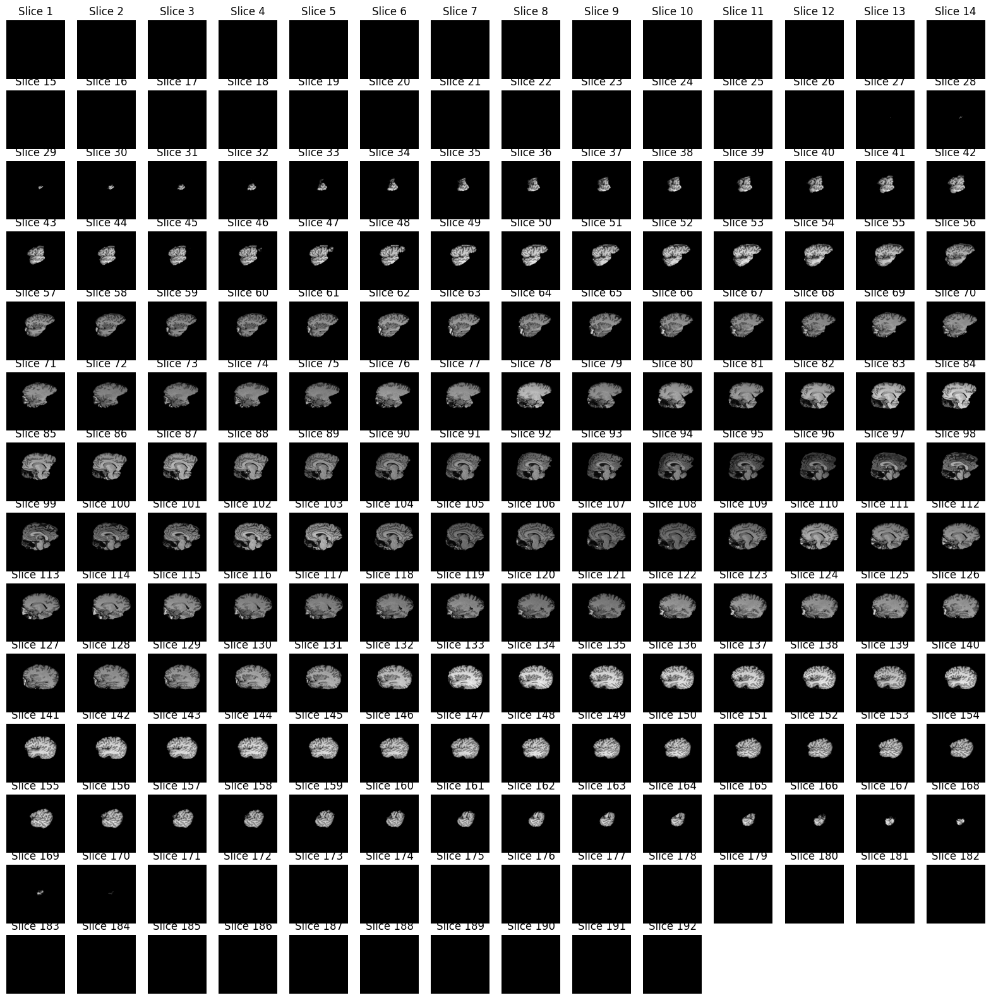

In [8]:
nifti_file = 'output_file_brain.nii.gz'
def visualize_nifti_grid(nifti_file):
    nifti_img = nib.load(nifti_file)
    nifti_data = nifti_img.get_fdata()
    num_slices = nifti_data.shape[2]
    
    cols = int(np.ceil(np.sqrt(num_slices)))
    rows = int(np.ceil(num_slices / cols))
    
    fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
    
    for i in range(rows * cols):
        row = i // cols
        col = i % cols
        ax = axes[row, col]
        
        if i < num_slices:
            ax.imshow(nifti_data[:, :, i], cmap='gray')
            ax.set_title(f'Slice {i+1}')
        ax.axis('off')
    
    plt.show()

# Visualizar en cuadrícula
visualize_nifti_grid(nifti_file)


proceso para el software


Visualizando Serie 5001 con 192 imágenes.


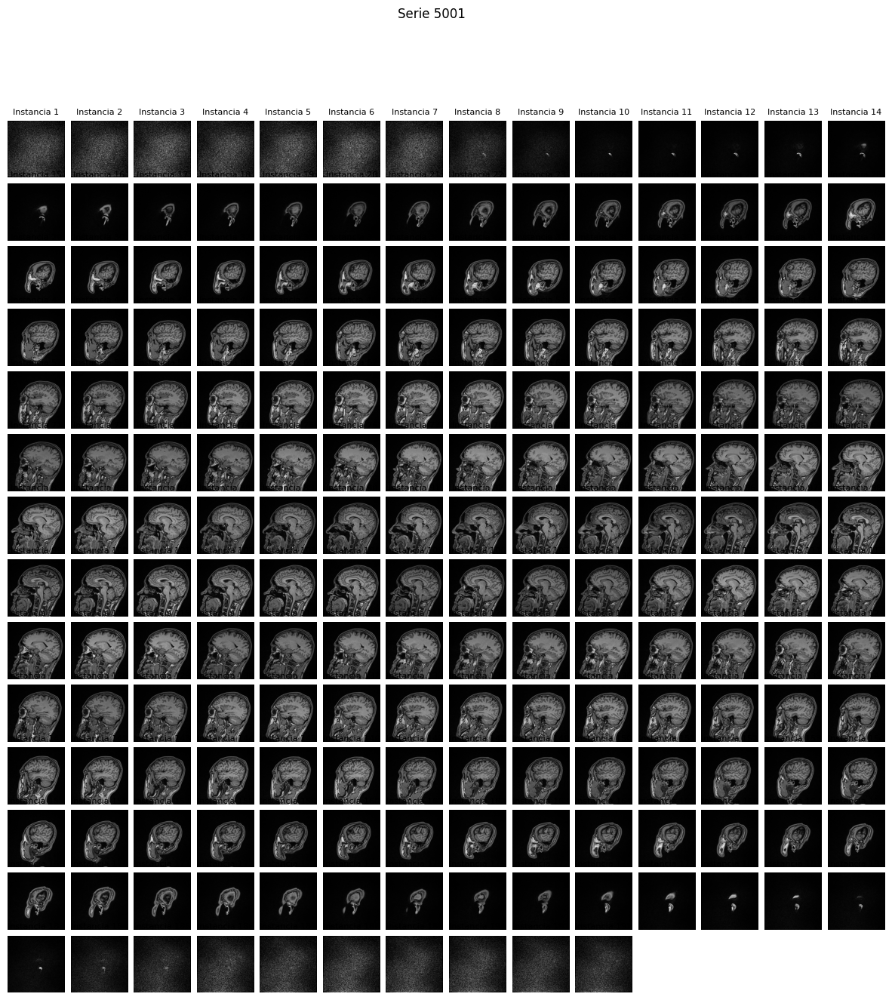


Visualizando Serie 6001 con 30 imágenes.


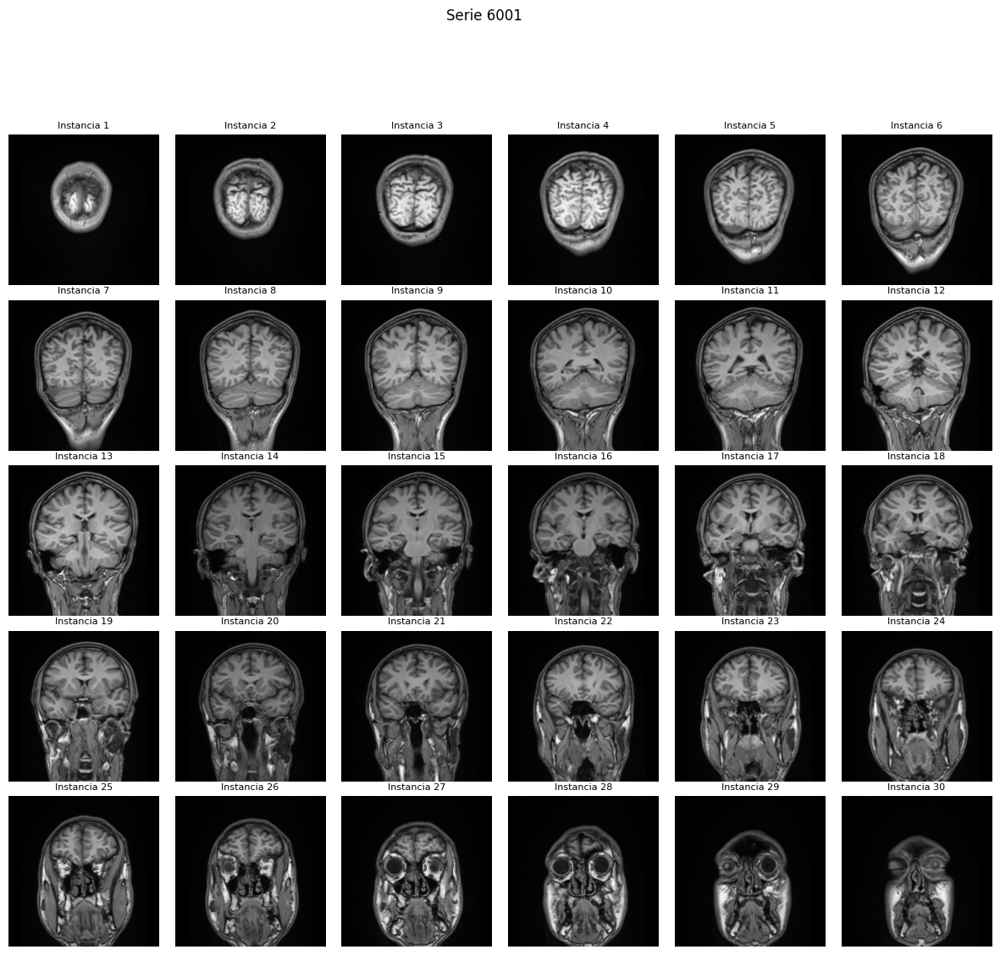


Visualizando Serie 9001 con 180 imágenes.


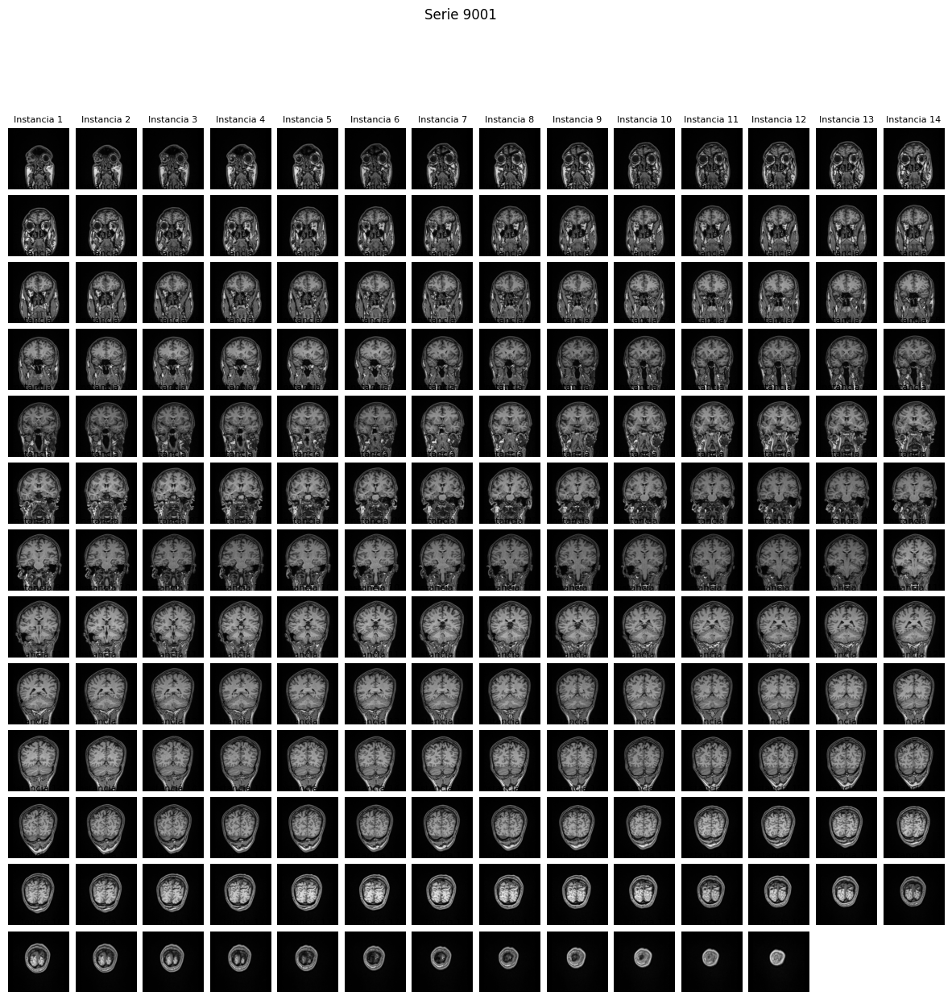


Visualizando Serie 10001 con 98 imágenes.


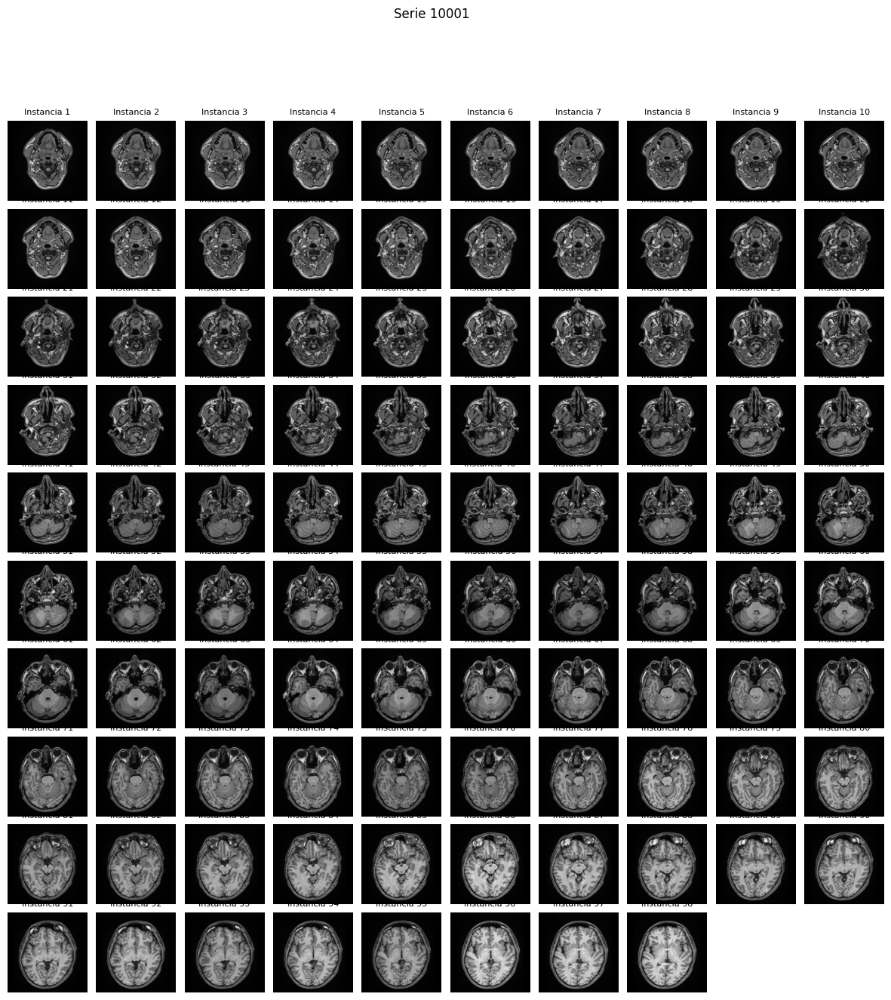

In [48]:

dicom_files = [os.path.join(dicom_folder, f) for f in os.listdir(dicom_folder)]

# Diccionario para almacenar archivos según la serie
dicom_files_by_series = defaultdict(list)

# Iterar sobre los archivos y clasificar según la serie
for dicom_file in dicom_files:
    try:
        dataset = pydicom.dcmread(dicom_file)
        series_number = dataset.SeriesNumber
        dicom_files_by_series[series_number].append((dataset.InstanceNumber, dicom_file))
    except Exception as e:
        print(f"No se pudo leer el archivo {dicom_file}: {e}")

# Visualizar las imágenes DICOM por serie en una cuadrícula
for series_number, files in dicom_files_by_series.items():
    # Ordenar los archivos dentro de cada serie por InstanceNumber
    files.sort(key=lambda x: x[0])
    
    print(f"\nVisualizando Serie {series_number} con {len(files)} imágenes.")
    
    # Determinar el tamaño de la cuadrícula para la visualización
    n_images = len(files)
    grid_size = int(np.ceil(np.sqrt(n_images)))
    
    # Crear figura y ejes para la visualización en cuadrícula
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    
    # Remover espacios entre subplots
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    
    # Visualizar cada archivo DICOM en la cuadrícula
    for i, (instance_number, dicom_file) in enumerate(files):
        dataset = pydicom.dcmread(dicom_file)
        ax = axes[i // grid_size, i % grid_size]
        ax.imshow(dataset.pixel_array, cmap=plt.cm.gray)
        ax.set_title(f"Instancia {instance_number}", fontsize=8)
        ax.axis('off')
    
    # Remover los subplots vacíos si no se llena toda la cuadrícula
    for j in range(i + 1, grid_size * grid_size):
        fig.delaxes(axes.flatten()[j])
    
    plt.suptitle(f"Serie {series_number}")
    plt.show()


# recorte

In [ ]:
import os
import pydicom
import numpy as np
import scipy.ndimage as ndimage
import matplotlib.pyplot as plt

# Cargar un archivo DICOM y convertirlo a una matriz numpy
def cargar_imagen_dicom(dicom_file):
    dataset = pydicom.dcmread(dicom_file)
    imagen = dataset.pixel_array
    return imagen

# Aplicar un recorte a la imagen para eliminar el rostro
def recortar_imagen(imagen):
    # Ajusta estos valores según la estructura de la imagen
    crop_x = (30, imagen.shape[0] - 20)  # Mantiene las filas, ajusta según sea necesario
    crop_y = (70, imagen.shape[1])  # Recorta las primeras columnas para eliminar el rostro
    
    recorte = imagen[crop_x[0]:crop_x[1], crop_y[0]:crop_y[1]]
    return recorte

# Umbral para segmentación del cerebro
def segmentar_cerebro(imagen, umbral_min=40, umbral_max=80):
    # Aplicar un umbral para segmentar
    segmentacion = np.where((imagen >= umbral_min) & (imagen <= umbral_max), 1, 0)
    
    # Rellenar agujeros y eliminar pequeñas regiones ruidosas
    segmentacion = ndimage.binary_fill_holes(segmentacion)
    segmentacion = ndimage.binary_erosion(segmentacion, iterations=2)
    segmentacion = ndimage.binary_dilation(segmentacion, iterations=2)
    
    return segmentacion

# Visualizar la segmentación del cerebro en una imagen
def visualizar_segmentacion(original, recorte, segmentacion):
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    ax[0].imshow(original, cmap='gray')
    ax[0].set_title('Imagen Original')
    ax[1].imshow(recorte, cmap='gray')
    ax[1].set_title('Imagen Recortada')
    ax[2].imshow(segmentacion, cmap='gray')
    ax[2].set_title('Segmentación del Cerebro')
    plt.show()

# Ruta de la carpeta donde están los archivos DICOM
dicom_files = [os.path.join(dicom_folder, f) for f in os.listdir(dicom_folder)]

# Procesar cada archivo DICOM
for dicom_file in dicom_files:
    imagen = cargar_imagen_dicom(dicom_file)
    
    # Aplicar recorte a la imagen
    imagen_recortada = recortar_imagen(imagen)
    
    # Aplicar segmentación en la imagen recortada
    segmentacion = segmentar_cerebro(imagen_recortada)
    
    # Visualizar la imagen original, recortada y la segmentación
    visualizar_segmentacion(imagen, imagen_recortada, segmentacion)


# otros metodos


Visualizando Serie 5001 con 192 imágenes.


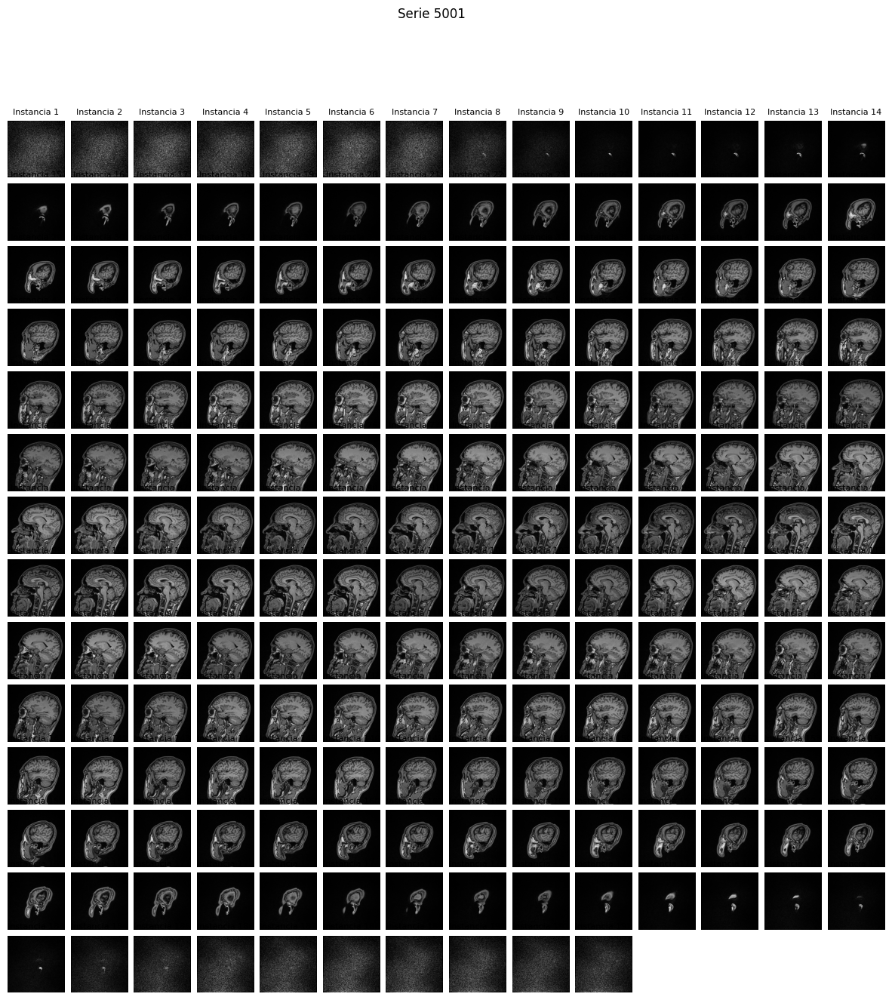


Visualizando Serie 6001 con 30 imágenes.


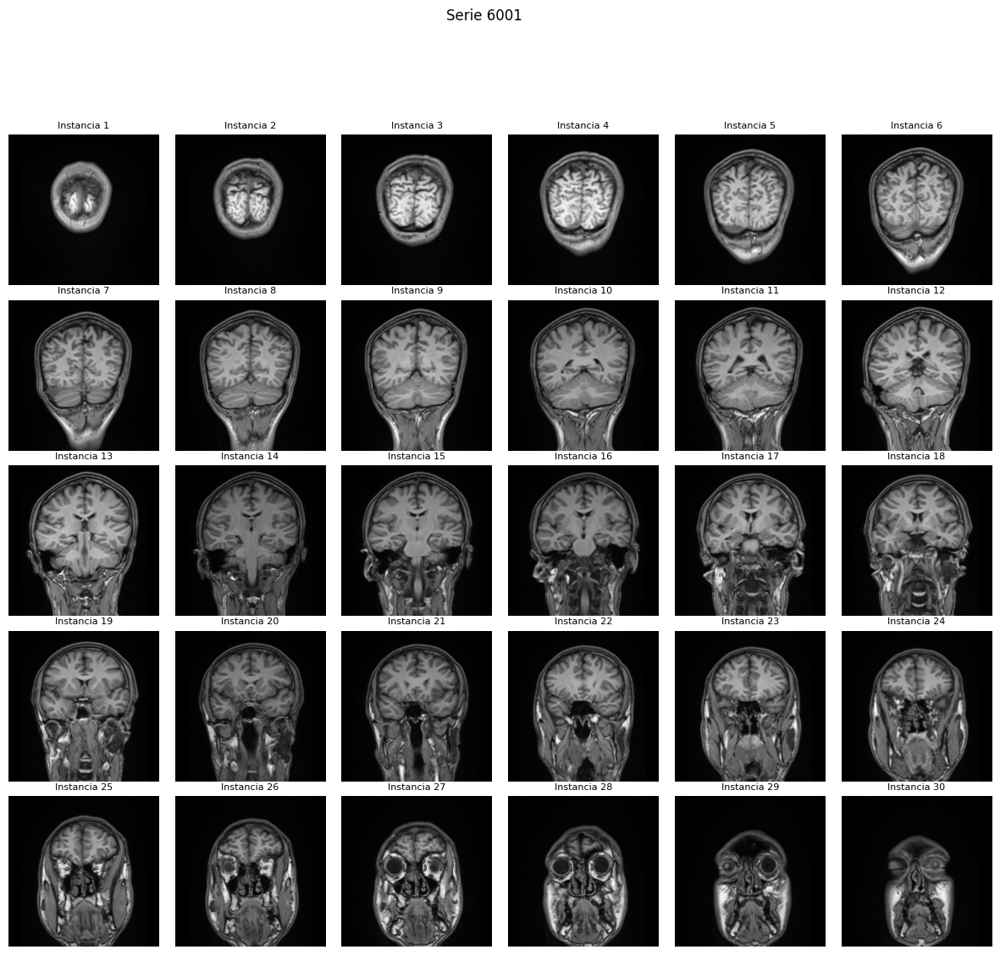


Visualizando Serie 9001 con 180 imágenes.


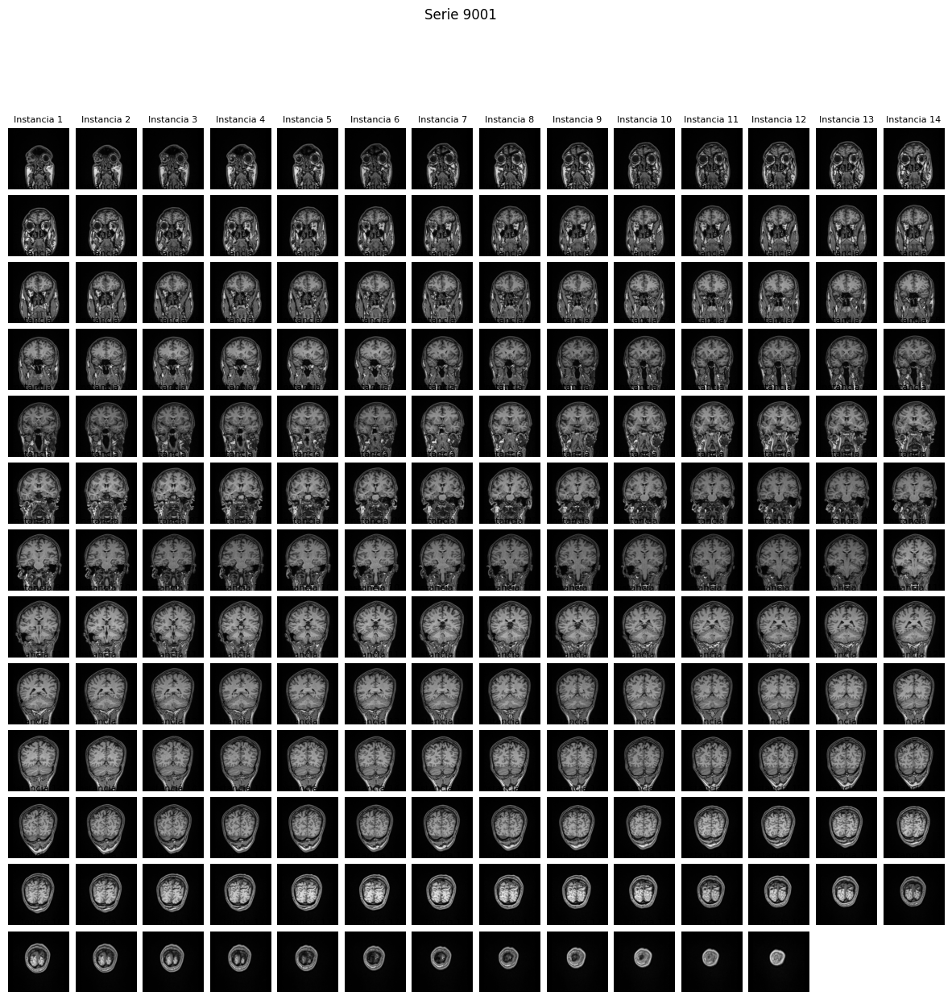


Visualizando Serie 10001 con 98 imágenes.


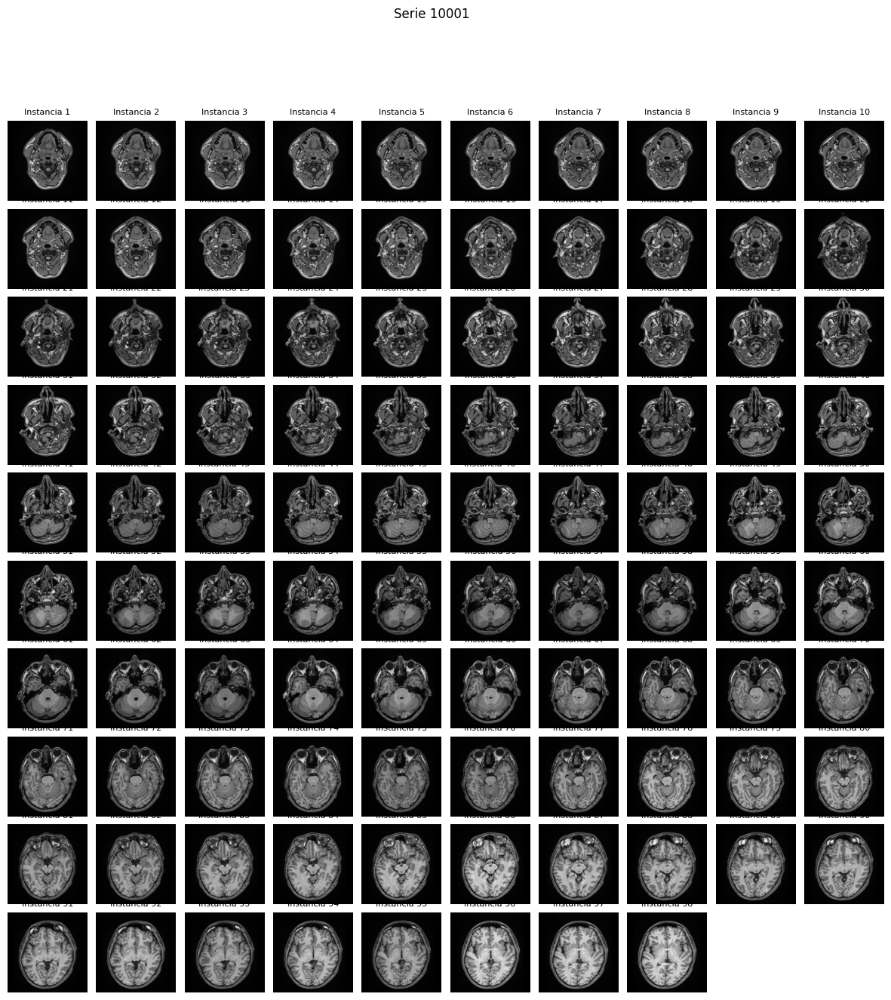

In [55]:
import os
import shutil
from collections import defaultdict
import pydicom
import matplotlib.pyplot as plt
import numpy as np

# Definir la carpeta donde se encuentran los DICOM
# Crear una carpeta de salida para almacenar las series organizadas
output_folder = 'dicom_series_organizadas'
os.makedirs(output_folder, exist_ok=True)

# Obtener todos los archivos DICOM en la carpeta
dicom_files = [os.path.join(dicom_folder, f) for f in os.listdir(dicom_folder)]

# Diccionario para almacenar archivos según la serie
dicom_files_by_series = defaultdict(list)

# Iterar sobre los archivos y clasificar según la serie
for dicom_file in dicom_files:
    try:
        dataset = pydicom.dcmread(dicom_file)
        series_number = dataset.SeriesNumber
        
        # Crear una carpeta para cada serie
        series_folder = os.path.join(output_folder, f'Serie_{series_number}')
        os.makedirs(series_folder, exist_ok=True)
        
        # Copiar el archivo a la carpeta de la serie correspondiente
        shutil.copy(dicom_file, series_folder)
        
        # Agregar el archivo al diccionario por serie
        dicom_files_by_series[series_number].append((dataset.InstanceNumber, dicom_file))
    except Exception as e:
        print(f"No se pudo leer el archivo {dicom_file}: {e}")

# Visualizar las imágenes DICOM por serie en una cuadrícula
for series_number, files in dicom_files_by_series.items():
    # Ordenar los archivos dentro de cada serie por InstanceNumber
    files.sort(key=lambda x: x[0])
    
    print(f"\nVisualizando Serie {series_number} con {len(files)} imágenes.")
    
    # Determinar el tamaño de la cuadrícula para la visualización
    n_images = len(files)
    grid_size = int(np.ceil(np.sqrt(n_images)))
    
    # Crear figura y ejes para la visualización en cuadrícula
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    
    # Remover espacios entre subplots
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    
    # Visualizar cada archivo DICOM en la cuadrícula
    for i, (instance_number, dicom_file) in enumerate(files):
        dataset = pydicom.dcmread(dicom_file)
        ax = axes[i // grid_size, i % grid_size]
        ax.imshow(dataset.pixel_array, cmap=plt.cm.gray)
        ax.set_title(f"Instancia {instance_number}", fontsize=8)
        ax.axis('off')
    
    # Remover los subplots vacíos si no se llena toda la cuadrícula
    for j in range(i + 1, grid_size * grid_size):
        fig.delaxes(axes.flatten()[j])
    
    plt.suptitle(f"Serie {series_number}")
    plt.show()


In [ ]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt

# Función para cargar un archivo DICOM y convertirlo a una matriz numpy
def cargar_imagen_dicom(dicom_file):
    dataset = pydicom.dcmread(dicom_file)
    imagen = dataset.pixel_array
    return imagen

# Función para aplicar un recorte a la imagen
def recortar_imagen(imagen):
    # Ajusta estos valores según la estructura de la imagen
    crop_x = (30, imagen.shape[0] - 20)  # Mantiene las filas, ajusta según sea necesario
    crop_y = (70, imagen.shape[1])  # Recorta las primeras columnas para eliminar el rostro
    
    recorte = imagen[crop_x[0]:crop_x[1], crop_y[0]:crop_y[1]]
    return recorte

# Función para visualizar la imagen original y recortada
def visualizar_segmentacion(original, recorte):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(original, cmap='gray')
    ax[0].set_title('Imagen Original')
    ax[1].imshow(recorte, cmap='gray')
    ax[1].set_title('Imagen Recortada')
    plt.show()

# Función para guardar la imagen recortada
def guardar_imagen_recortada(dataset, imagen_recortada, output_file):
    dataset.PixelData = imagen_recortada.tobytes()
    dataset.Rows, dataset.Columns = imagen_recortada.shape
    dataset.save_as(output_file)

# Selecciona la serie que quieres procesar
serie_a_procesar = 'Serie_5001'  # Cambia esto según la serie que deseas recortar

# Ruta a la carpeta donde están organizadas las series
dicom_series_folder = 'dicom_series_organizadas'

# Ruta de la carpeta de la serie seleccionada
serie_folder = os.path.join(dicom_series_folder, serie_a_procesar)

# Crear una carpeta para guardar las imágenes recortadas
output_folder = os.path.join(serie_folder, 'recortadas')
os.makedirs(output_folder, exist_ok=True)

# Obtener los archivos DICOM de la serie seleccionada
dicom_files = [os.path.join(serie_folder, f) for f in os.listdir(serie_folder)]

# Procesar cada archivo DICOM en la serie seleccionada
for dicom_file in dicom_files:
    # Cargar la imagen DICOM
    imagen = cargar_imagen_dicom(dicom_file)
    
    # Aplicar recorte a la imagen
    imagen_recortada = recortar_imagen(imagen)
    
    # Visualizar la imagen original y la imagen recortada (opcional)
    visualizar_segmentacion(imagen, imagen_recortada)
    
    # Guardar la imagen recortada en la carpeta de salida
    dataset = pydicom.dcmread(dicom_file)
    output_file = os.path.join(output_folder, os.path.basename(dicom_file))
    guardar_imagen_recortada(dataset, imagen_recortada, output_file)

    print(f"Imagen recortada guardada en: {output_file}")


In [1]:
import os
import pydicom
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Función para cargar un archivo DICOM y convertirlo a una matriz numpy
def cargar_imagen_dicom(dicom_file):
    dataset = pydicom.dcmread(dicom_file)
    imagen = dataset.pixel_array
    return dataset, imagen

# Función de recorte
def recortar_manual(imagen, recorte_coords):
    x1, y1, x2, y2 = recorte_coords
    recorte = imagen[int(y1):int(y2), int(x1):int(x2)]
    return recorte

# Callback para manejar la selección del área de recorte
def seleccionar_area_recorte(imagen):
    fig = px.imshow(imagen, color_continuous_scale='gray')
    fig.update_layout(dragmode='select', title='Selecciona el área de recorte y luego presiona "Enter"')

    fig.show()

    # Espera a que el usuario seleccione un área y presione Enter
    recorte_coords = []
    
    def on_select(trace, points, selector):
        nonlocal recorte_coords
        recorte_coords = [selector.xrange[0], selector.yrange[0], selector.xrange[1], selector.yrange[1]]

    fig.data[0].on_selection(on_select)
    
    # Necesitamos esperar a que se realice la selección (esto es asíncrono, necesita integración con Dash)
    input("Después de seleccionar el área, presiona Enter para continuar...")

    return recorte_coords

# Seleccionar la serie que quieres procesar
serie_a_procesar = 'Serie_5001'  # Cambia esto según la serie que deseas recortar

# Ruta a la carpeta donde están organizadas las series
dicom_series_folder = 'dicom_series_organizadas'

# Ruta de la carpeta de la serie seleccionada
serie_folder = os.path.join(dicom_series_folder, serie_a_procesar)

# Crear una carpeta para guardar las imágenes recortadas
output_folder = os.path.join(serie_folder, 'recortadas')
os.makedirs(output_folder, exist_ok=True)

# Obtener los archivos DICOM de la serie seleccionada y ordenarlos por nombre
dicom_files = sorted([os.path.join(serie_folder, f) for f in os.listdir(serie_folder) ])

# Seleccionar la imagen de la mitad para la selección del área de recorte
mid_index = len(dicom_files) // 2
dataset, imagen = cargar_imagen_dicom(dicom_files[mid_index])

# Permitir al usuario seleccionar el área de recorte
area_recorte = seleccionar_area_recorte(imagen)

# Aplicar el recorte a todas las imágenes en la serie seleccionada
for dicom_file in dicom_files:
    dataset, imagen = cargar_imagen_dicom(dicom_file)
    
    # Aplicar recorte a la imagen usando las coordenadas seleccionadas
    imagen_recortada = recortar_manual(imagen, area_recorte)
    
    # Guardar la imagen recortada en la carpeta de salida
    output_file = os.path.join(output_folder, os.path.basename(dicom_file))
    guardar_imagen_recortada(dataset, imagen_recortada, output_file)

    print(f"Imagen recortada guardada en: {output_file}")


ValueError: not enough values to unpack (expected 4, got 0)

In [2]:
import os
import pydicom
import numpy as np
from tkinter import Tk, Label, Canvas, Button, NW
from PIL import Image, ImageTk

# Función para cargar un archivo DICOM y convertirlo a una matriz numpy
def cargar_imagen_dicom(dicom_file):
    try:
        dataset = pydicom.dcmread(dicom_file)
        imagen = dataset.pixel_array
        return dataset, imagen
    except Exception as e:
        print(f"Error al leer el archivo {dicom_file}: {e}")
        return None, None

# Función de recorte
def recortar_manual(imagen, recorte_coords):
    x1, y1, x2, y2 = recorte_coords
    recorte = imagen[int(y1):int(y2), int(x1):int(x2)]
    return recorte

# Función para guardar la imagen recortada
def guardar_imagen_recortada(dataset, imagen_recortada, output_file):
    dataset.PixelData = imagen_recortada.tobytes()
    dataset.Rows, dataset.Columns = imagen_recortada.shape
    dataset.save_as(output_file)

# Clase para manejar la selección de la región en una ventana Tkinter
class RecorteSelector:
    def __init__(self, master, imagen):
        self.master = master
        self.imagen = Image.fromarray(imagen)
        self.tk_imagen = ImageTk.PhotoImage(self.imagen)  # Guardar la referencia de la imagen
        self.canvas = Canvas(master, width=self.imagen.width, height=self.imagen.height)
        self.canvas.pack()
        
        self.canvas.create_image(0, 0, anchor=NW, image=self.tk_imagen)
        
        self.rect_id = None
        self.start_x = None
        self.start_y = None
        
        self.canvas.bind("<ButtonPress-1>", self.on_button_press)
        self.canvas.bind("<B1-Motion>", self.on_mouse_drag)
        self.canvas.bind("<ButtonRelease-1>", self.on_button_release)
        
        self.recorte_coords = None

    def on_button_press(self, event):
        self.start_x = event.x
        self.start_y = event.y
        self.rect_id = self.canvas.create_rectangle(self.start_x, self.start_y, self.start_x, self.start_y, outline='red')

    def on_mouse_drag(self, event):
        cur_x, cur_y = event.x, event.y
        self.canvas.coords(self.rect_id, self.start_x, self.start_y, cur_x, cur_y)

    def on_button_release(self, event):
        end_x, end_y = event.x, event.y
        self.recorte_coords = (self.start_x, self.start_y, end_x, end_y)
        self.master.quit()  # Cerrar la ventana cuando se selecciona el área

# Seleccionar la serie que quieres procesar
serie_a_procesar = 'Serie_5001'  # Cambia esto según la serie que deseas recortar

# Ruta a la carpeta donde están organizadas las series
dicom_series_folder = 'dicom_series_organizadas'

# Ruta de la carpeta de la serie seleccionada
serie_folder = os.path.join(dicom_series_folder, serie_a_procesar)

# Crear una carpeta para guardar las imágenes recortadas
output_folder = os.path.join(serie_folder, 'recortadas')
os.makedirs(output_folder, exist_ok=True)

# Obtener todos los archivos de la serie seleccionada, independientemente de la extensión
dicom_files = sorted([os.path.join(serie_folder, f) for f in os.listdir(serie_folder) if os.path.isfile(os.path.join(serie_folder, f))])

# Filtrar y asegurarse de que sean archivos DICOM
dicom_files = [f for f in dicom_files if cargar_imagen_dicom(f)[0] is not None]

# Seleccionar la imagen de la mitad para la selección del área de recorte
mid_index = len(dicom_files) // 2
dataset, imagen = cargar_imagen_dicom(dicom_files[mid_index])

# Crear la ventana para la selección de área de recorte
root = Tk()
selector = RecorteSelector(root, imagen)
root.mainloop()

# Obtener las coordenadas seleccionadas por el usuario
area_recorte = selector.recorte_coords

# Aplicar el recorte a todas las imágenes en la serie seleccionada
for dicom_file in dicom_files:
    dataset, imagen = cargar_imagen_dicom(dicom_file)
    
    if imagen is not None:
        # Aplicar recorte a la imagen usando las coordenadas seleccionadas
        imagen_recortada = recortar_manual(imagen, area_recorte)
        
        # Guardar la imagen recortada en la carpeta de salida
        output_file = os.path.join(output_folder, os.path.basename(dicom_file))
        guardar_imagen_recortada(dataset, imagen_recortada, output_file)

        print(f"Imagen recortada guardada en: {output_file}")

# Cerrar la ventana Tkinter después de completar el proceso
root.destroy()


Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154922
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154933
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154944
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154955
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154966
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154977
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154988
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154999
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62155010
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62155021
Imagen recortada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62155032
Imagen recortada guardada en: dicom_series_organizadas

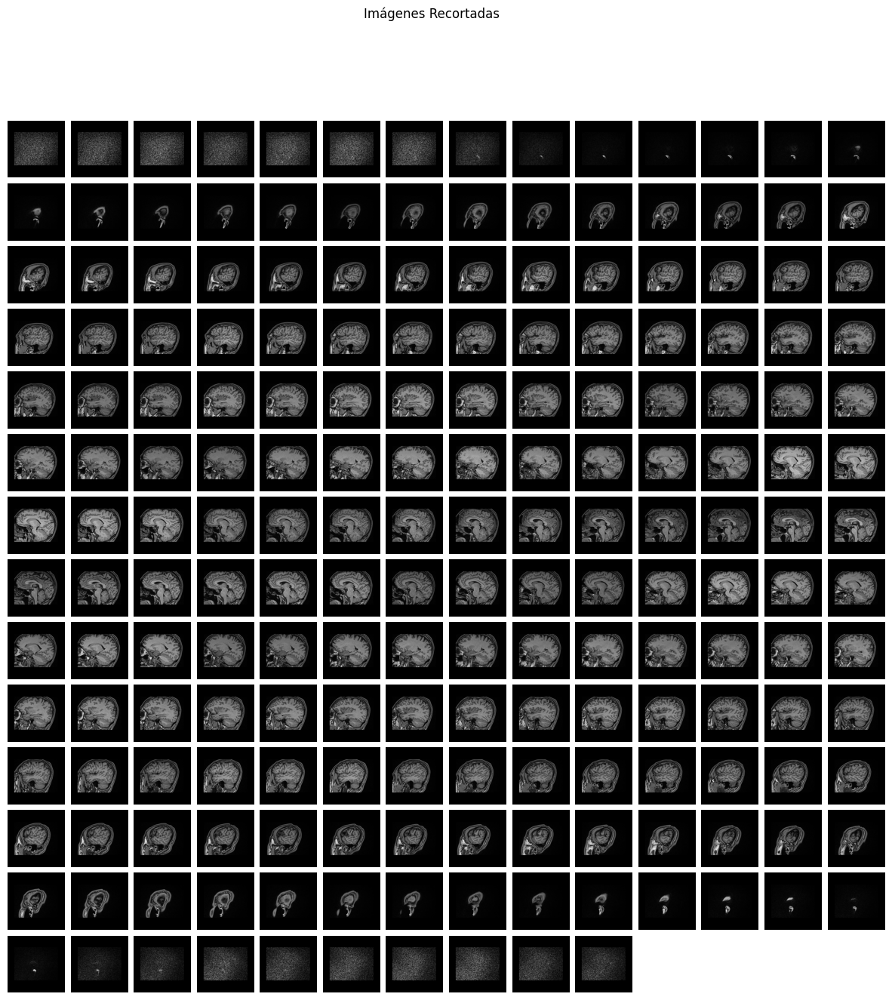

In [2]:
import os
import pydicom
import numpy as np
import matplotlib.pyplot as plt

# Función para cargar un archivo DICOM y convertirlo a una matriz numpy
def cargar_imagen_dicom(dicom_file):
    dataset = pydicom.dcmread(dicom_file)
    imagen = dataset.pixel_array
    return dataset, imagen

# Función para cargar y mostrar todas las imágenes recortadas en una sola gráfica
def visualizar_imagenes_recortadas(output_folder):
    # Obtener los archivos DICOM recortados
    dicom_files = sorted([os.path.join(output_folder, f) for f in os.listdir(output_folder) ])
    
    # Cargar todas las imágenes recortadas
    imagenes = []
    for dicom_file in dicom_files:
        dataset, imagen = cargar_imagen_dicom(dicom_file)
        imagenes.append(imagen)
    
    # Calcular el tamaño de la cuadrícula
    n_images = len(imagenes)
    grid_size = int(np.ceil(np.sqrt(n_images)))
    
    # Crear la figura y los subplots
    fig, axes = plt.subplots(grid_size, grid_size, figsize=(15, 15))
    
    # Remover espacios entre subplots
    plt.subplots_adjust(wspace=0.1, hspace=0.1)
    
    # Visualizar cada imagen en la cuadrícula
    for i, imagen in enumerate(imagenes):
        ax = axes[i // grid_size, i % grid_size]
        ax.imshow(imagen, cmap='gray')
        ax.axis('off')  # Opcional: Para ocultar los ejes
    
    # Eliminar subplots vacíos
    for j in range(i + 1, grid_size * grid_size):
        fig.delaxes(axes.flatten()[j])
    
    plt.suptitle("Imágenes Recortadas")
    plt.show()

# Ruta a la carpeta de salida donde se guardaron las imágenes recortadas
output_folder = 'dicom_series_organizadas/Serie_5001/recortadas'  # Ajusta esto según tu estructura

# Visualizar las imágenes recortadas
visualizar_imagenes_recortadas(output_folder)


In [1]:
import os
import pydicom
import numpy as np
from tkinter import Tk, Label, Canvas, Button, NW, messagebox
from PIL import Image, ImageTk

# Función para cargar un archivo DICOM y convertirlo a una matriz numpy
def cargar_imagen_dicom(dicom_file):
    try:
        dataset = pydicom.dcmread(dicom_file)
        imagen = dataset.pixel_array
        return dataset, imagen
    except Exception as e:
        print(f"Error al leer el archivo {dicom_file}: {e}")
        return None, None

# Función de recorte con padding
def recortar_manual(imagen, recorte_coords):
    x1, y1, x2, y2 = recorte_coords
    recorte = imagen[int(y1):int(y2), int(x1):int(x2)]
    
    # Dimensiones originales
    original_height, original_width = imagen.shape
    
    # Dimensiones del recorte
    recorte_height, recorte_width = recorte.shape
    
    # Crear una imagen nueva con el tamaño original y rellenada con ceros (negro)
    imagen_con_padding = np.zeros((original_height, original_width), dtype=imagen.dtype)
    
    # Calcular la posición para centrar el recorte en la nueva imagen
    start_y = (original_height - recorte_height) // 2
    start_x = (original_width - recorte_width) // 2
    
    # Colocar el recorte en la imagen con padding
    imagen_con_padding[start_y:start_y + recorte_height, start_x:start_x + recorte_width] = recorte
    
    return imagen_con_padding

# Función para guardar la imagen recortada
def guardar_imagen_recortada(dataset, imagen_recortada, output_file):
    dataset.PixelData = imagen_recortada.tobytes()
    dataset.Rows, dataset.Columns = imagen_recortada.shape
    dataset.save_as(output_file)

# Clase para manejar la selección de la región en una ventana Tkinter
class RecorteSelector:
    def __init__(self, master, imagen):
        self.master = master
        self.imagen = Image.fromarray(imagen)
        self.tk_imagen = ImageTk.PhotoImage(self.imagen)  # Guardar la referencia de la imagen
        self.canvas = Canvas(master, width=self.imagen.width, height=self.imagen.height)
        self.canvas.pack()
        
        self.canvas.create_image(0, 0, anchor=NW, image=self.tk_imagen)
        
        self.rect_id = None
        self.start_x = None
        self.start_y = None
        
        self.canvas.bind("<ButtonPress-1>", self.on_button_press)
        self.canvas.bind("<B1-Motion>", self.on_mouse_drag)
        self.canvas.bind("<ButtonRelease-1>", self.on_button_release)
        
        self.recorte_coords = None

    def on_button_press(self, event):
        self.start_x = event.x
        self.start_y = event.y
        self.rect_id = self.canvas.create_rectangle(self.start_x, self.start_y, self.start_x, self.start_y, outline='red')

    def on_mouse_drag(self, event):
        cur_x, cur_y = event.x, event.y
        self.canvas.coords(self.rect_id, self.start_x, self.start_y, cur_x, cur_y)

    def on_button_release(self, event):
        end_x, end_y = event.x, event.y
        self.recorte_coords = (self.start_x, self.start_y, end_x, end_y)
        self.master.quit()  # Cerrar la ventana cuando se selecciona el área

# Función para mostrar el cuadro de diálogo de confirmación
def confirmar_recorte():
    return messagebox.askyesno("Confirmar Recorte", "¿Estás seguro de que deseas aplicar este recorte?")

# Función para seleccionar el área de recorte con confirmación
def seleccionar_area_con_confirmacion(imagen):
    while True:
        # Crear la ventana para la selección de área de recorte
        root = Tk()
        selector = RecorteSelector(root, imagen)
        root.mainloop()

        # Obtener las coordenadas seleccionadas por el usuario
        area_recorte = selector.recorte_coords

        # Confirmar si desea aplicar el recorte
        if confirmar_recorte():
            root.destroy()  # Destruir la ventana si se confirma el recorte
            return area_recorte
        else:
            root.destroy()  # Destruir la ventana si no se confirma el recorte
            messagebox.showinfo("Reintentar", "Selecciona el área de recorte nuevamente.")
            # La ventana se volverá a abrir al inicio del ciclo

# Seleccionar la serie que quieres procesar
serie_a_procesar = 'Serie_5001'  # Cambia esto según la serie que deseas recortar

# Ruta a la carpeta donde están organizadas las series
dicom_series_folder = 'dicom_series_organizadas'

# Ruta de la carpeta de la serie seleccionada
serie_folder = os.path.join(dicom_series_folder, serie_a_procesar)

# Crear una carpeta para guardar las imágenes recortadas
output_folder = os.path.join(serie_folder, 'recortadas')
os.makedirs(output_folder, exist_ok=True)

# Obtener todos los archivos de la serie seleccionada, independientemente de la extensión
dicom_files = sorted([os.path.join(serie_folder, f) for f in os.listdir(serie_folder) if os.path.isfile(os.path.join(serie_folder, f))])

# Filtrar y asegurarse de que sean archivos DICOM
dicom_files = [f for f in dicom_files if cargar_imagen_dicom(f)[0] is not None]

# Seleccionar la imagen de la mitad para la selección del área de recorte
mid_index = len(dicom_files) // 2
dataset, imagen = cargar_imagen_dicom(dicom_files[mid_index])

# Seleccionar el área de recorte con confirmación
area_recorte = seleccionar_area_con_confirmacion(imagen)

# Aplicar el recorte con padding a todas las imágenes en la serie seleccionada
for dicom_file in dicom_files:
    dataset, imagen = cargar_imagen_dicom(dicom_file)
    
    if imagen is not None:
        # Aplicar recorte con padding a la imagen usando las coordenadas seleccionadas
        imagen_recortada = recortar_manual(imagen, area_recorte)
        
        # Guardar la imagen recortada con padding en la carpeta de salida
        output_file = os.path.join(output_folder, os.path.basename(dicom_file))
        guardar_imagen_recortada(dataset, imagen_recortada, output_file)

        print(f"Imagen recortada y rellenada guardada en: {output_file}")



Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154922
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154933
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154944
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154955
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154966
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154977
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154988
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62154999
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62155010
Imagen recortada y rellenada guardada en: dicom_series_organizadas\Serie_5001\recortadas\62155021
Imagen recortada y r

NameError: name 'root' is not defined